In [ ]:
import numpy as np
import os
import cv2
from skimage import exposure
from skimage.color import rgb2gray
from skimage import morphology
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.utils import Sequence
from tensorflow.keras.layers import (Input, Conv2D, MaxPooling2D, Dropout,
                                     BatchNormalization, Activation, Concatenate, Conv2DTranspose)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import MeanIoU

import albumentations as A
from tensorflow.keras.utils import Sequence

In [ ]:
# checking if TensorFlow can use GPU, ideally don't train/run without one
# Otherwise it will take a long time to finish

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
class NumpyDataGenerator(Sequence):
    """
    Creating a Keras-compatible generator that:
    1) Memory-maps .npy files to avoid loading all data in RAM.
    2) Loads batches of RGB images + masks.
    3) Normalizes images to [0..1].
    4) Applies CLAHE to each channel.
    5) Applies random flips and rotations if augment=True.
    6) Converts one-hot masks to integer if needed (sparse).
    7) Clips mask labels to [0..num_classes - 1].
    """

    def __init__(self, images_path, masks_path, batch_size=4, num_classes=6, shuffle=True, max_samples=None, augment=False):
        self.images = np.load(images_path, mmap_mode='r')
        self.masks = np.load(masks_path, mmap_mode='r')

        if len(self.images) != len(self.masks):
            raise ValueError("Images and masks must have same length")

        if max_samples is not None:
            self.images = self.images[:max_samples]
            self.masks = self.masks[:max_samples]

        self.batch_size = batch_size
        self.num_classes = num_classes
        self.shuffle = shuffle
        self.augment = augment
        self.indexes = np.arange(len(self.images))
        self.on_epoch_end()

        # Albumentations: doing flips and rotations
        self.augmentation_pipeline = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
        ])

    def __len__(self):
        return int(np.ceil(len(self.images) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_indexes = self.indexes[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_images_raw = self.images[batch_indexes]
        batch_masks_raw = self.masks[batch_indexes]

        batch_images = []
        batch_masks = []
        
        #Contrast Limited AHE (CLAHE)
        for img, mask in zip(batch_images_raw, batch_masks_raw):
            # CLAHE per channel
            img_clahe = np.zeros_like(img)
            for c in range(3):
                img_uint8 = (img[..., c]).astype(np.uint8)
                clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
                img_clahe[..., c] = clahe.apply(img_uint8)

            # Normalize to [0, 1]
            img_clahe = img_clahe.astype(np.float32) / 255.0

            # Convert one-hot to integer labels if needed
            if mask.ndim == 3 and mask.shape[-1] == self.num_classes:
                mask = np.argmax(mask, axis=-1)

            mask = np.clip(mask, 0, self.num_classes - 1).astype(np.uint8)

            # Apply augmentations
            if self.augment:
                augmented = self.augmentation_pipeline(image=img_clahe, mask=mask)
                img_clahe = augmented['image']
                mask = augmented['mask']

            batch_images.append(img_clahe)
            batch_masks.append(mask)

        batch_images = np.stack(batch_images, axis=0)
        batch_masks = np.stack(batch_masks, axis=0)
        return batch_images, batch_masks

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

## Creating model and related metrics

In [ ]:
# Down-weighting background (class 5)
# Improve model's classification performance
class_weights = tf.constant([1., 1., 1., 1., 1., 0.1], dtype=tf.float32)

def weighted_sparse_categorical_crossentropy(y_true, y_pred):
    # sparse_categorical_entropy with custom weights to
    # improve classification performance
    y_true = tf.cast(y_true, tf.int32)
    y_true_onehot = tf.one_hot(y_true, depth=y_pred.shape[-1])

    # Get weights per pixel based on class ID
    weights = tf.reduce_sum(class_weights * y_true_onehot, axis=-1)

    unweighted_loss = tf.keras.losses.sparse_categorical_crossentropy(y_true, y_pred)
    weighted_loss = unweighted_loss * weights

    return tf.reduce_mean(weighted_loss)

# --- Custom Dice Loss ---
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true = tf.one_hot(tf.cast(y_true, tf.int32), depth=y_pred.shape[-1])
    y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true + y_pred, axis=[1, 2, 3])
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - tf.reduce_mean(dice)

def combined_loss(y_true, y_pred):
    ce = weighted_sparse_categorical_crossentropy(y_true, y_pred)
    d = dice_loss(y_true, y_pred)
    return ce + d

# f1_class factory to provide f1 metric for a given class_idx
def make_f1_metric(class_idx):
    
    def f1_class(y_true, y_pred):
        y_true = tf.squeeze(tf.cast(y_true, tf.int32))
        y_pred = tf.argmax(y_pred, axis=-1)

        y_true_class = tf.cast(tf.equal(y_true, class_idx), tf.float32)
        y_pred_class = tf.cast(tf.equal(y_pred, class_idx), tf.float32)

        tp = tf.keras.backend.sum(y_true_class * y_pred_class)
        fp = tf.keras.backend.sum(y_pred_class) - tp
        fn = tf.keras.backend.sum(y_true_class) - tp

        precision = tp / (tp + fp + tf.keras.backend.epsilon())
        recall = tp / (tp + fn + tf.keras.backend.epsilon())
        f1 = 2 * precision * recall / (precision + recall + tf.keras.backend.epsilon())

        return f1

    f1_class.__name__ = f'f1_class_{class_idx}'
    return f1_class

# dice_class factory to provide per-class dice scores
def make_dice_metric(class_idx):

    def dice_class(y_true, y_pred):
        y_true = tf.squeeze(tf.cast(y_true, tf.int32))
        y_pred = tf.argmax(y_pred, axis=-1)

        y_true_class = tf.cast(tf.equal(y_true, class_idx), tf.float32)
        y_pred_class = tf.cast(tf.equal(y_pred, class_idx), tf.float32)

        intersection = tf.keras.backend.sum(y_true_class * y_pred_class)
        union = tf.keras.backend.sum(y_true_class) + tf.keras.backend.sum(y_pred_class)

        return (2. * intersection + tf.keras.backend.epsilon()) / (union + tf.keras.backend.epsilon())
    
    dice_class.__name__ = f'dice_class_{class_idx}'
    return dice_class

In [ ]:
# Creating the U-Net Model
def conv_block(x, filters):
    x = Conv2D(filters, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(filters, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x


def build_unet(input_shape=(256, 256, 3), num_classes=6):
    inputs = Input(shape=input_shape)

    c1 = conv_block(inputs, 64)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1, 128)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2, 256)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = conv_block(p3, 512)
    p4 = MaxPooling2D((2, 2))(c4)

    c5 = conv_block(p4, 1024)

    u6 = Conv2DTranspose(512, 2, strides=2, padding='same')(c5)
    u6 = Concatenate()([u6, c4])
    c6 = conv_block(u6, 512)
    c6 = Dropout(0.3)(c6)

    u7 = Conv2DTranspose(256, 2, strides=2, padding='same')(c6)
    u7 = Concatenate()([u7, c3])
    c7 = conv_block(u7, 256)
    c7 = Dropout(0.3)(c7)

    u8 = Conv2DTranspose(128, 2, strides=2, padding='same')(c7)
    u8 = Concatenate()([u8, c2])
    c8 = conv_block(u8, 128)
    c8 = Dropout(0.2)(c8)

    u9 = Conv2DTranspose(64, 2, strides=2, padding='same')(c8)
    u9 = Concatenate()([u9, c1])
    c9 = conv_block(u9, 64)
    c9 = Dropout(0.2)(c9)

    outputs = Conv2D(num_classes, 1, activation='softmax')(c9)

    model = Model(inputs, outputs)
    return model

In [ ]:
# Creating a class to provide mean IoU as a metric
class MeanIoUWrapper(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, name="mean_iou", **kwargs):
        super().__init__(num_classes=num_classes, name=name, **kwargs)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.argmax(y_pred, axis=-1)
        return super().update_state(y_true, y_pred, sample_weight)

## Training and validating the model

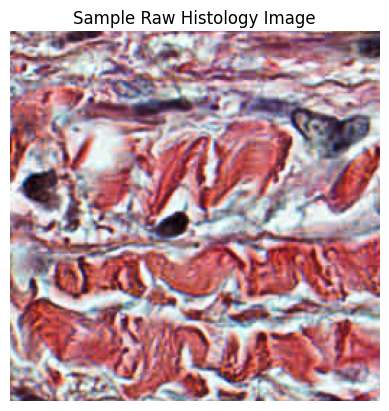

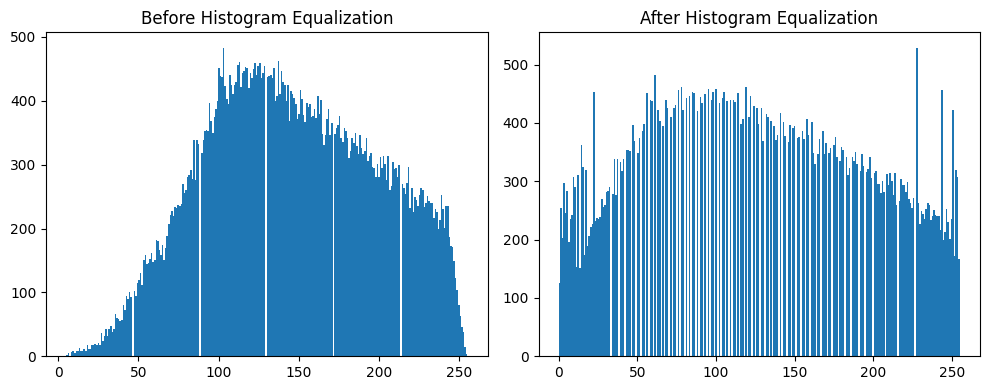

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_95 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_5[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_95[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_90       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_96 (Conv2D)  │ (None, 256, 256,  │     36,928 │ activation_90[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_96[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_91       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_20    │ (None, 128, 128,  │          0 │ activation_91[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_97 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_20… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_97[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_92       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_98 (Conv2D)  │ (None, 128, 128,  │    147,584 │ activation_92[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_98[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_93       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_21    │ (None, 64, 64,    │          0 │ activation_93[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_99 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_21… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │      1,024 │ conv2d_99[0][0] 

 Total params: 31,055,622 (118.47 MB)

 Trainable params: 31,043,846 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

/home/mals/anaconda3/envs/BMEN/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25


2025-04-06 01:20:25.455531: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator compile_loss/combined_loss/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


582/631 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - accuracy: 0.6122 - dice_class_0: 0.3004 - dice_class_1: 0.0850 - dice_class_2: 0.1494 - dice_class_3: 2.8718e-04 - dice_class_4: 0.0577 - f1_class_0: 0.3004 - f1_class_1: 0.0850 - f1_class_2: 0.1494 - f1_class_3: 2.8718e-04 - f1_class_4: 0.0577 - loss: 0.9617 - mean_iou: 0.1678

2025-04-06 01:22:00.383092: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator compile_loss/combined_loss/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


631/631 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.6213 - dice_class_0: 0.3042 - dice_class_1: 0.0876 - dice_class_2: 0.1542 - dice_class_3: 2.7915e-04 - dice_class_4: 0.0584 - f1_class_0: 0.3042 - f1_class_1: 0.0876 - f1_class_2: 0.1542 - f1_class_3: 2.7914e-04 - f1_class_4: 0.0584 - loss: 0.9497 - mean_iou: 0.1708

2025-04-06 01:22:16.954960: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:39] Ignoring Assert operator compile_loss/combined_loss/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


631/631 ━━━━━━━━━━━━━━━━━━━━ 165s 213ms/step - accuracy: 0.6215 - dice_class_0: 0.3043 - dice_class_1: 0.0876 - dice_class_2: 0.1543 - dice_class_3: 2.7898e-04 - dice_class_4: 0.0584 - f1_class_0: 0.3043 - f1_class_1: 0.0876 - f1_class_2: 0.1543 - f1_class_3: 2.7898e-04 - f1_class_4: 0.0584 - loss: 0.9494 - mean_iou: 0.1709 - val_accuracy: 0.8291 - val_dice_class_0: 0.2380 - val_dice_class_1: 0.0486 - val_dice_class_2: 0.2913 - val_dice_class_3: 0.9428 - val_dice_class_4: 0.1324 - val_f1_class_0: 0.2350 - val_f1_class_1: 0.0019 - val_f1_class_2: 0.2898 - val_f1_class_3: 0.0000e+00 - val_f1_class_4: 0.0646 - val_loss: 0.6839 - val_mean_iou: 0.2341 - learning_rate: 1.0000e-04
Epoch 2/25
631/631 ━━━━━━━━━━━━━━━━━━━━ 127s 201ms/step - accuracy: 0.8107 - dice_class_0: 0.4156 - dice_class_1: 0.1352 - dice_class_2: 0.3128 - dice_class_3: 0.0185 - dice_class_4: 0.1005 - f1_class_0: 0.4156 - f1_class_1: 0.1352 - f1_class_2: 0.3128 - f1_class_3: 1.1132e-05 - f1_class_4: 0.1005 - loss: 0.6259 - m

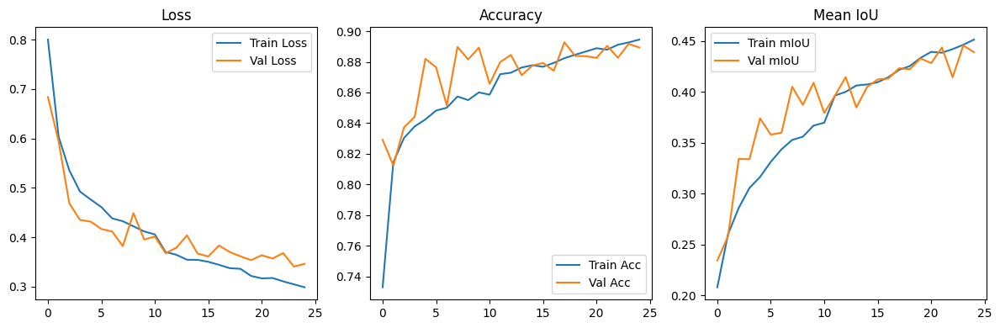

664/664 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step - accuracy: 0.9009 - dice_class_0: 0.5254 - dice_class_1: 0.3907 - dice_class_2: 0.4770 - dice_class_3: 0.9697 - dice_class_4: 0.3873 - f1_class_0: 0.5200 - f1_class_1: 0.3254 - f1_class_2: 0.4715 - f1_class_3: 0.0000e+00 - f1_class_4: 0.1931 - loss: 0.2916 - mean_iou: 0.4600
Evaluation results:
loss: 0.3406
compile_metrics: 0.8917


In [ ]:
base_path = "/home/mals/Repos/BMEN-509-Final-Project"

val_images_path = os.path.join(base_path, "Fold1", "images", "fold1", "images.npy")
val_masks_path = os.path.join(base_path, "Fold1", "masks", "fold1", "masks.npy")

train_images_path = os.path.join(base_path, "Fold2", "images", "fold2", "images.npy")
train_masks_path = os.path.join(base_path, "Fold2", "masks", "fold2", "masks.npy")

train_gen = NumpyDataGenerator(train_images_path, train_masks_path, batch_size=4, num_classes=6, shuffle=True, augment=True)
val_gen = NumpyDataGenerator(val_images_path, val_masks_path, batch_size=4, num_classes=6, shuffle=False,  augment=False)

num_classes = 6
model = build_unet(input_shape=(256, 256, 3), num_classes=num_classes)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=combined_loss,
    metrics=[
        'accuracy', 
        MeanIoUWrapper(num_classes=num_classes),
        *[make_f1_metric(i) for i in range(5)],
        *[make_dice_metric(i) for i in range(5)]
    ]
)

model.summary()

# Early stopping if the model stops improving for 5 epochs
callbacks = [
    EarlyStopping(patience=5, restore_best_weights=True),
    ReduceLROnPlateau(factor=0.5, patience=3, verbose=1)
]

# Setting number of epochs to 25 due to resource constraints
epochs = 25

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=epochs,
    callbacks=callbacks
)

# Visualizing the training curves
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title("Loss")
plt.legend()
plt.subplot(1, 3, 2)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title("Accuracy")
plt.legend()
plt.subplot(1, 3, 3)
if 'mean_iou' in history.history:
    plt.plot(history.history['mean_iou'], label='Train mIoU')
    plt.plot(history.history['val_mean_iou'], label='Val mIoU')
    plt.title("Mean IoU")
    plt.legend()
plt.tight_layout()
plt.show()

# Displaying validation metrics
results = model.evaluate(val_gen)
print("Evaluation results:")
for name, val in zip(model.metrics_names, results):
    print(f"{name}: {val:.4f}")

## Image preprocessing visualizations

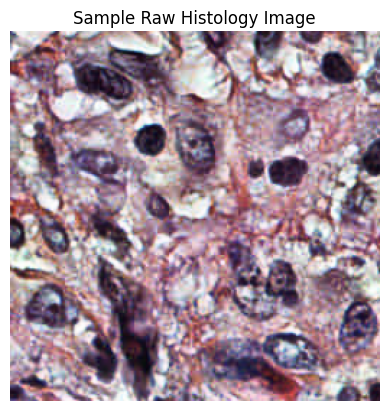

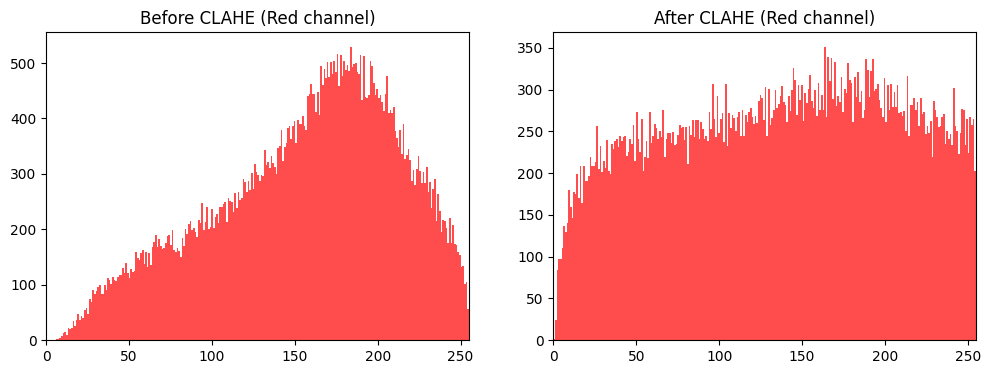

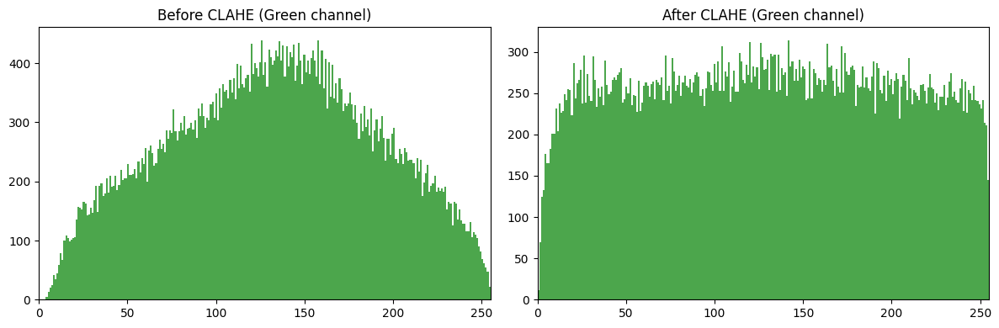

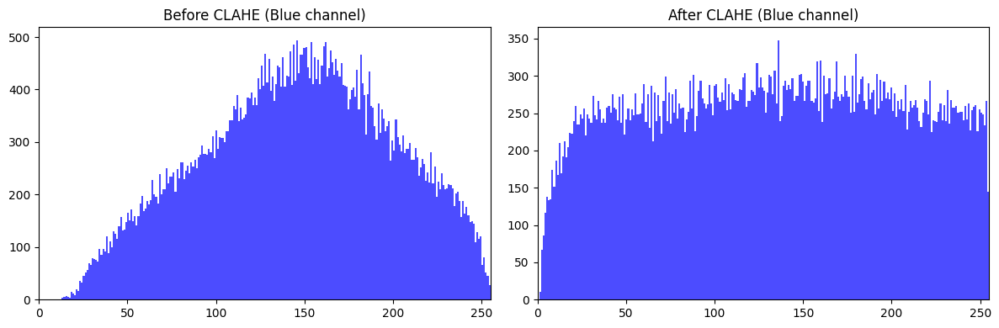

In [ ]:
# Sample Raw Histology Image
sample_img, sample_mask = train_gen[0]
img = sample_img[0]

# Histogram Equalization Before & After
img_uint8 = (img * 255).astype(np.uint8)

# Applying CLAHE
img_clahe = np.zeros_like(img_uint8)
for c in range(3):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img_clahe[..., c] = clahe.apply(img_uint8[..., c])

original_channel = img_uint8[..., 0]
clahe_channel = img_clahe[..., 0]

fig, axs = plt.subplots(1, 2, figsize=(12, 4))

axs[0].hist(original_channel.ravel(), bins=256, range=(0, 255), color='red', alpha=0.7)
axs[0].set_title("Before CLAHE (Red channel)")
axs[0].set_xlim(0, 255)

axs[1].hist(clahe_channel.ravel(), bins=256, range=(0, 255), color='red', alpha=0.7)
axs[1].set_title("After CLAHE (Red channel)")
axs[1].set_xlim(0, 255)


original_channel = img_uint8[..., 1]
clahe_channel = img_clahe[..., 1]

fig, axs = plt.subplots(1, 2, figsize=(12, 4))

axs[0].hist(original_channel.ravel(), bins=256, range=(0, 255), color='green', alpha=0.7)
axs[0].set_title("Before CLAHE (Green channel)")
axs[0].set_xlim(0, 255)

axs[1].hist(clahe_channel.ravel(), bins=256, range=(0, 255), color='green', alpha=0.7)
axs[1].set_title("After CLAHE (Green channel)")
axs[1].set_xlim(0, 255)
plt.tight_layout()
plt.show()

original_channel = img_uint8[..., 2]
clahe_channel = img_clahe[..., 2]

# Plotting histogram of intensity values (not normalized)
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

axs[0].hist(original_channel.ravel(), bins=256, range=(0, 255), color='blue', alpha=0.7)
axs[0].set_title("Before CLAHE (Blue channel)")
axs[0].set_xlim(0, 255)

axs[1].hist(clahe_channel.ravel(), bins=256, range=(0, 255), color='blue', alpha=0.7)
axs[1].set_title("After CLAHE (Blue channel)")
axs[1].set_xlim(0, 255)
plt.tight_layout()
plt.show()

In [ ]:
# Evaluating the model
val_results = model.evaluate(val_gen)

# Validation Metrics
metric_names = model.metrics_names
for name, val in zip(metric_names, val_results):
    print(f"{name}: {val:.4f}")

664/664 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step - accuracy: 0.9009 - dice_class_0: 0.5254 - dice_class_1: 0.3907 - dice_class_2: 0.4770 - dice_class_3: 0.9697 - dice_class_4: 0.3873 - f1_class_0: 0.5200 - f1_class_1: 0.3254 - f1_class_2: 0.4715 - f1_class_3: 0.0000e+00 - f1_class_4: 0.1931 - loss: 0.2916 - mean_iou: 0.4600
loss: 0.3406
compile_metrics: 0.8917


## Test Scores

In [ ]:
base_path = "/home/mals/Repos/BMEN-509-Final-Project"

test_images_path = os.path.join(base_path, "Fold3", "images", "fold3", "images.npy")
test_masks_path = os.path.join(base_path, "Fold3", "masks", "fold3", "masks.npy")

test_generator = NumpyDataGenerator(test_images_path, test_masks_path, batch_size=4, num_classes=6, shuffle=True)

results = model.evaluate(test_generator)
print(f"Test Loss: {results[0]}")
print(f"Test Accuracy: {results[1]}")

for name, val in zip(model.metrics_names, results):
    print(f"{name}: {val:.4f}")

681/681 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - accuracy: 0.8831 - dice_class_0: 0.6237 - dice_class_1: 0.4638 - dice_class_2: 0.5075 - dice_class_3: 0.8649 - dice_class_4: 0.3786 - f1_class_0: 0.6237 - f1_class_1: 0.4498 - f1_class_2: 0.5075 - f1_class_3: 0.0000e+00 - f1_class_4: 0.2708 - loss: 0.3785 - mean_iou: 0.4408
Test Loss: 0.3914876878261566
Test Accuracy: 0.8812568783760071
loss: 0.3915
compile_metrics: 0.8813


## Visualizing results after testing


Sample 1
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


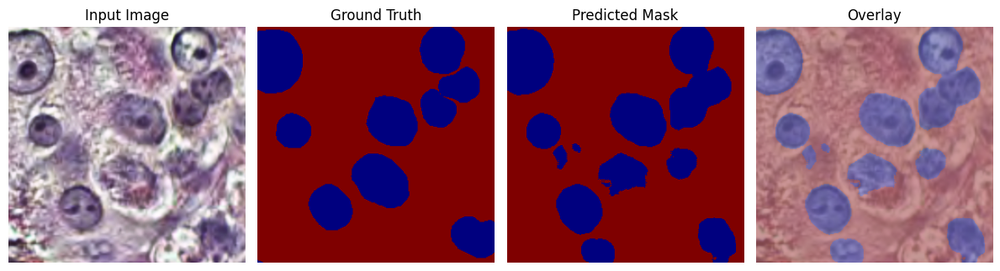

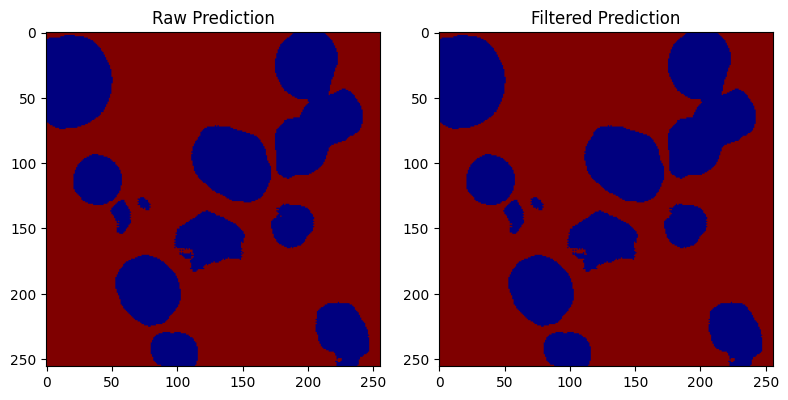

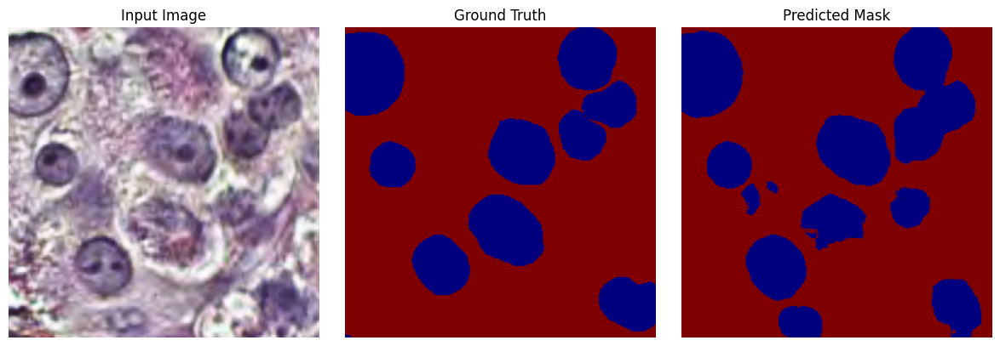


Sample 2
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


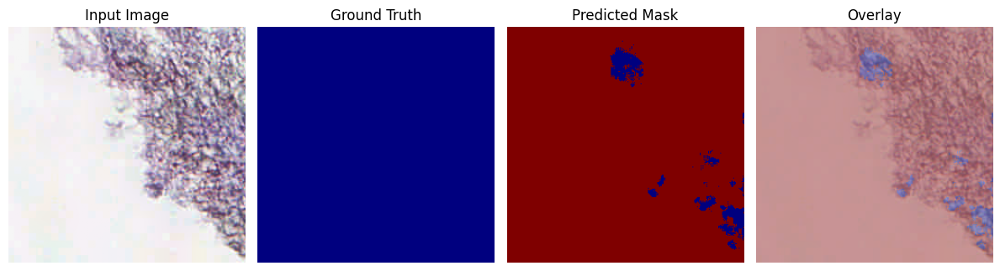

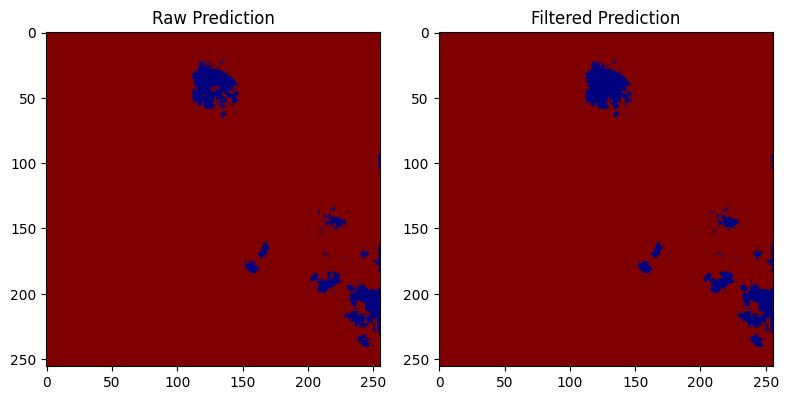

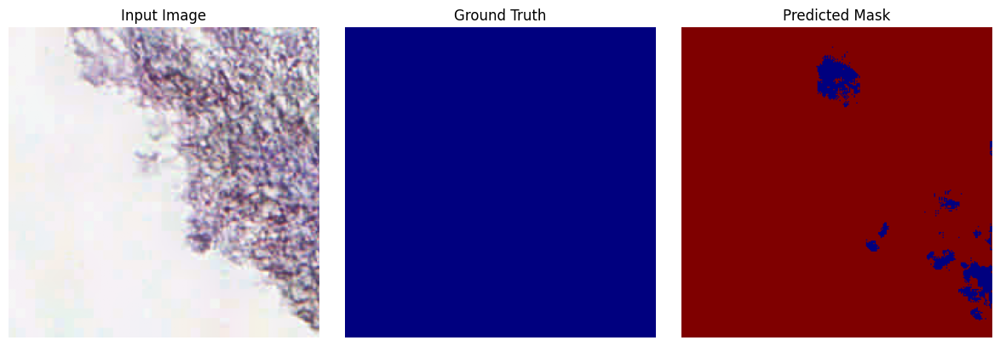


Sample 3
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


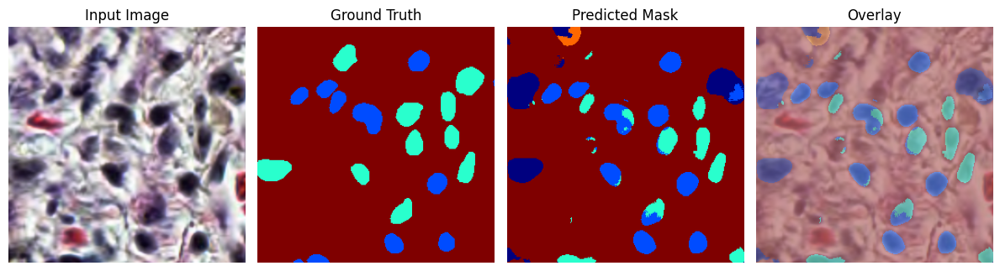

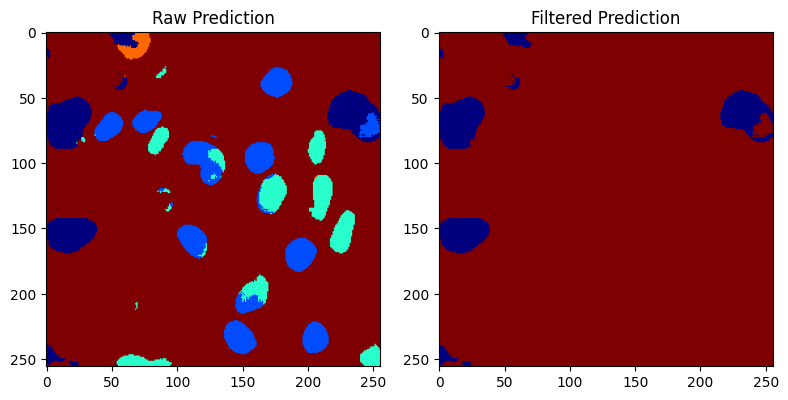

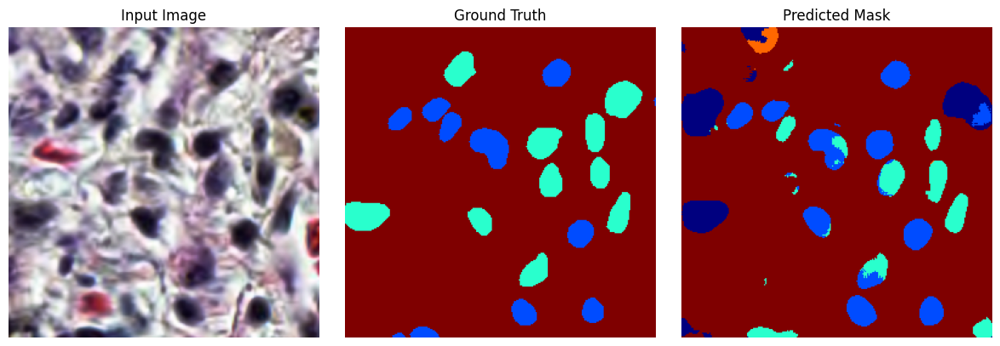


Sample 4
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


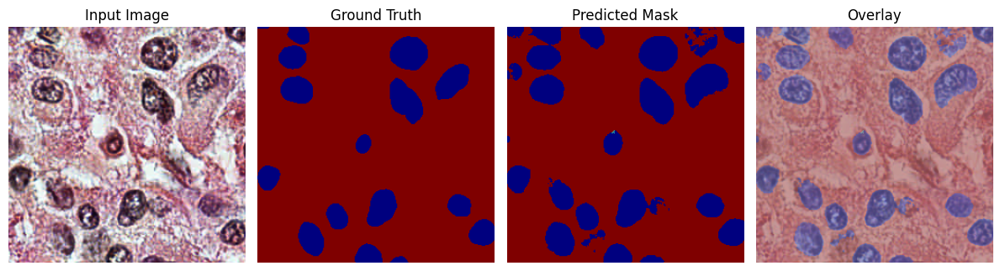

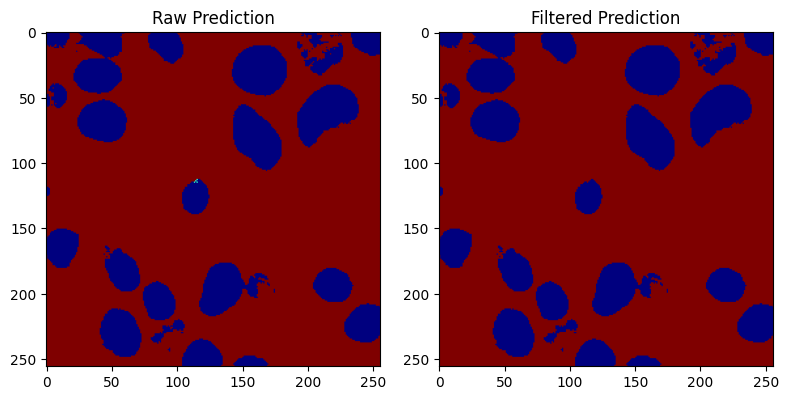

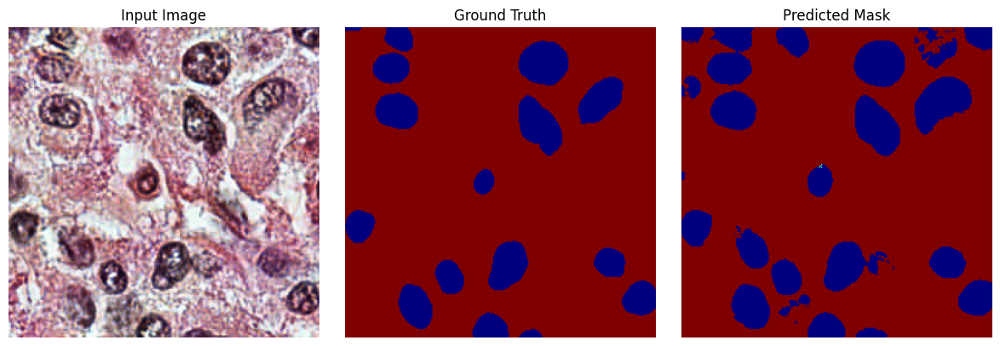


Sample 5
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


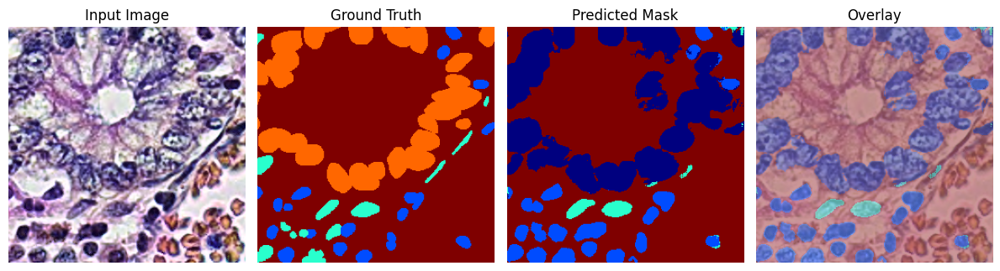

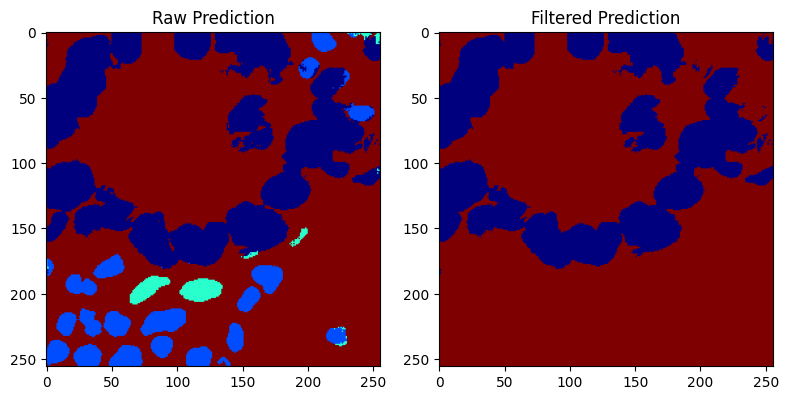

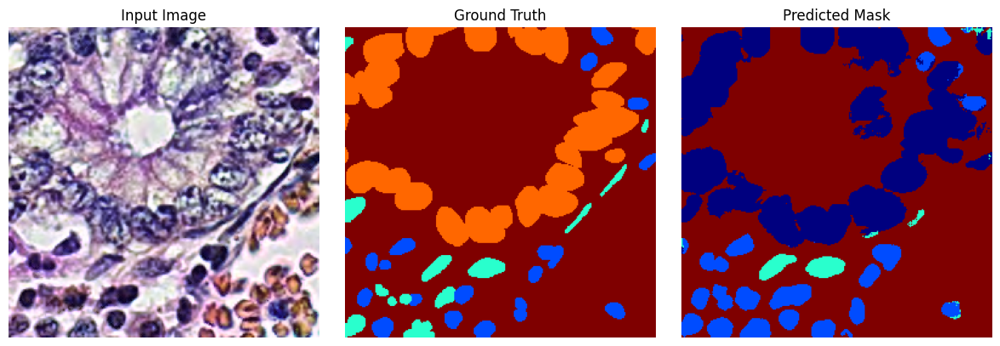


Sample 6
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


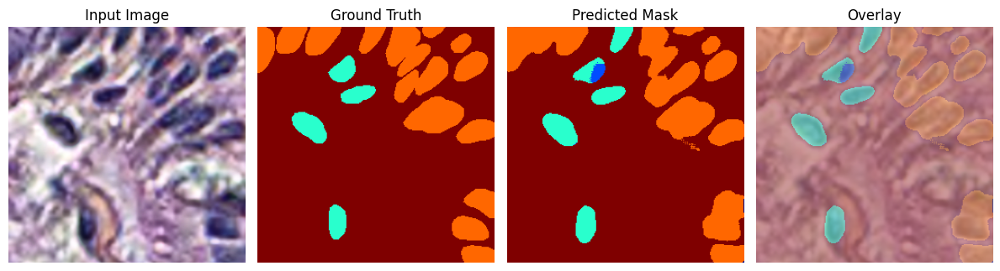

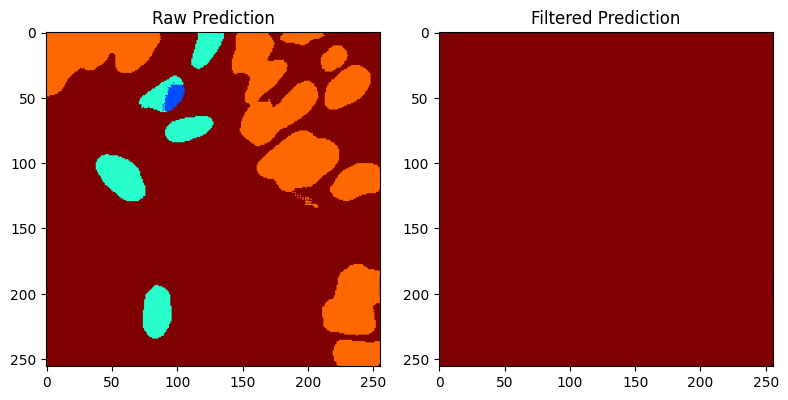

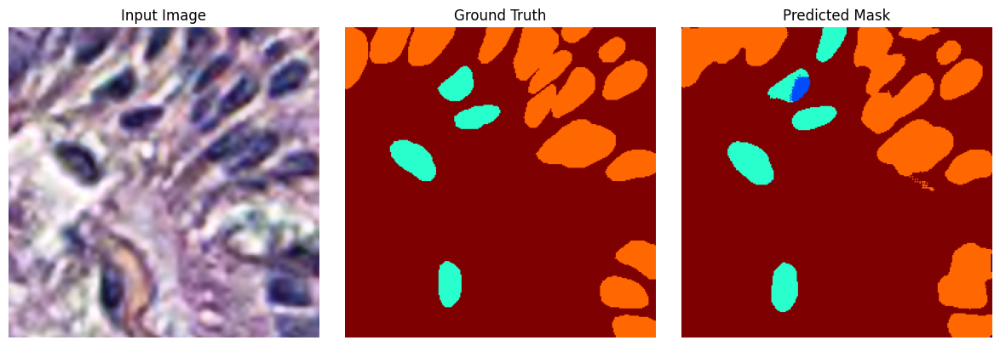


Sample 7
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


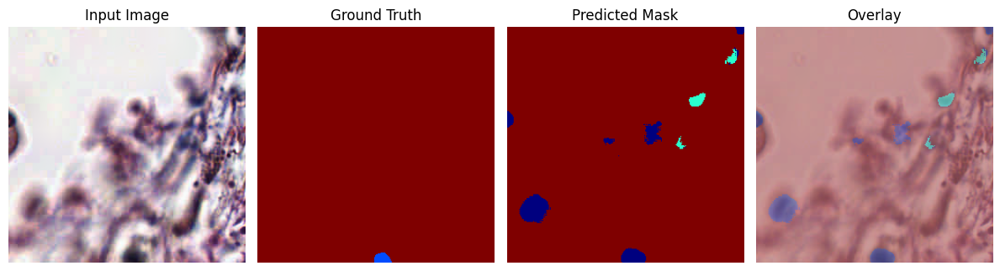

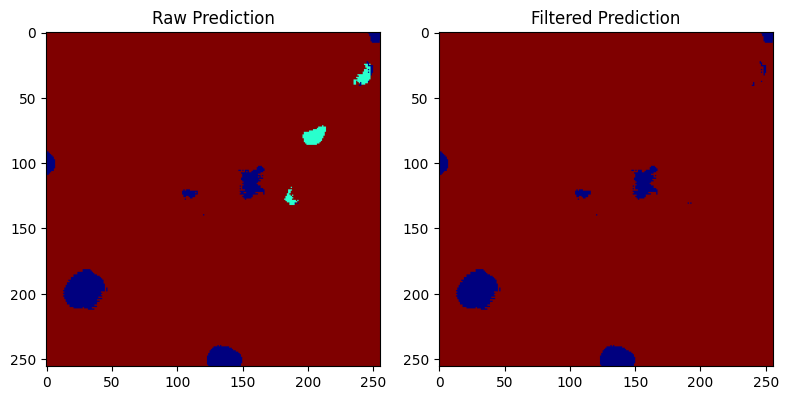

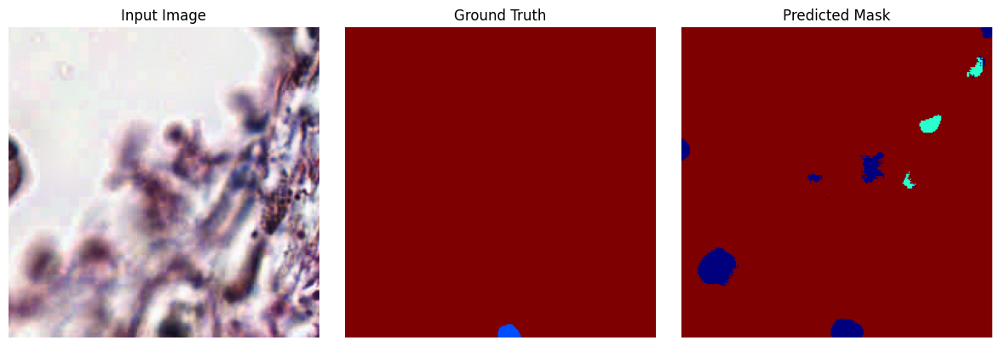


Sample 8
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


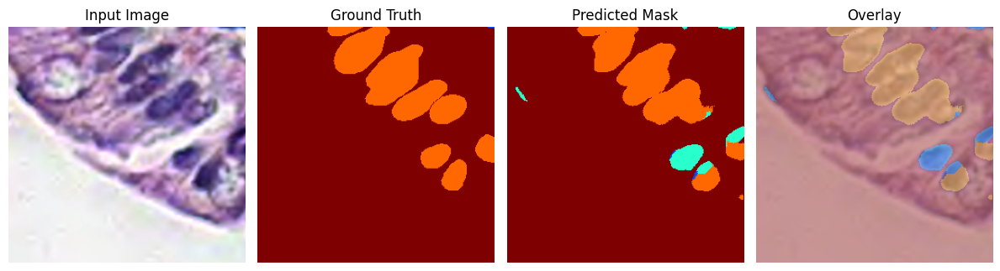

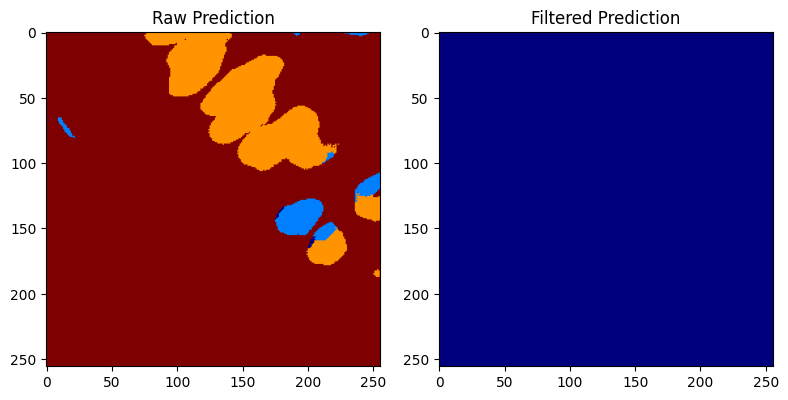

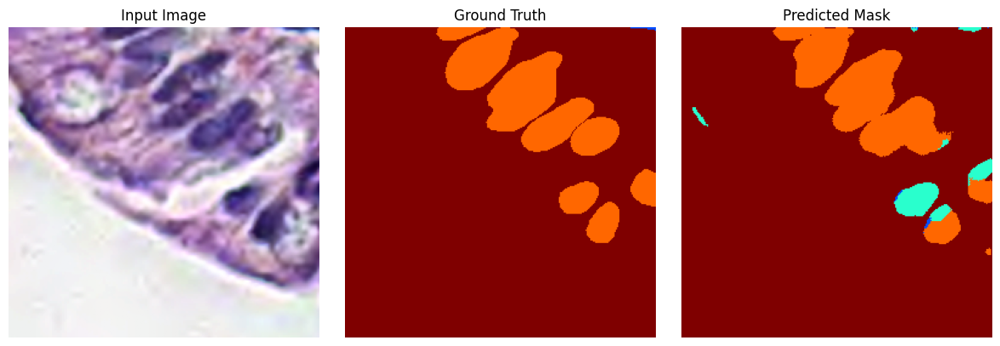


Sample 9
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


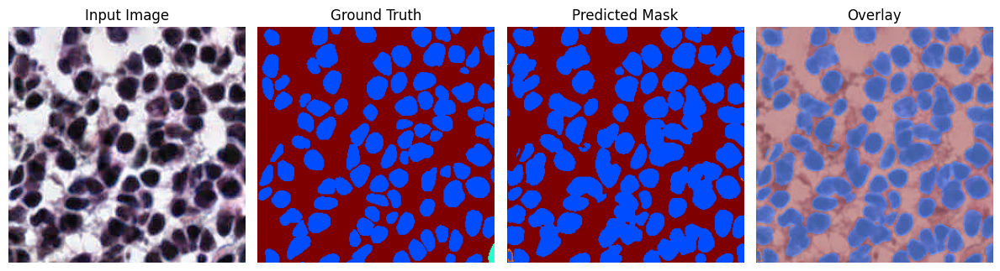

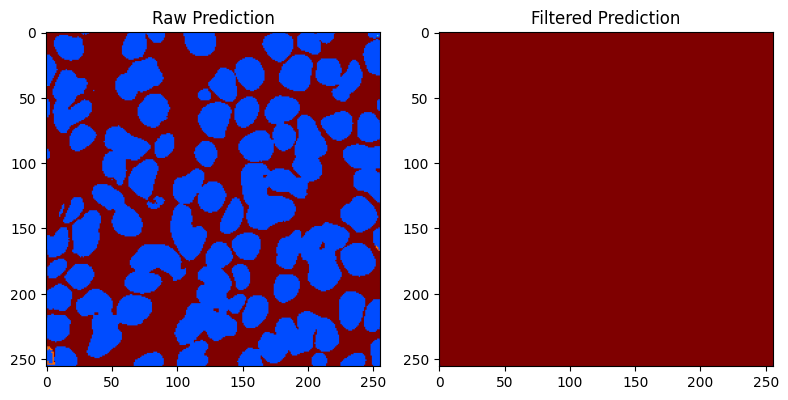

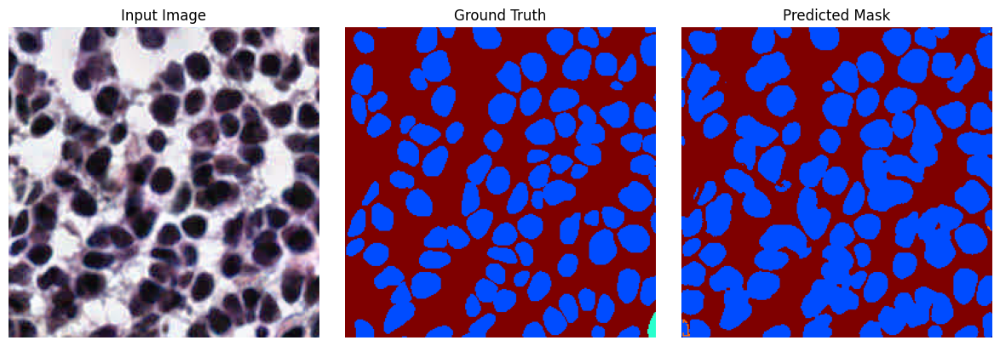


Sample 10
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


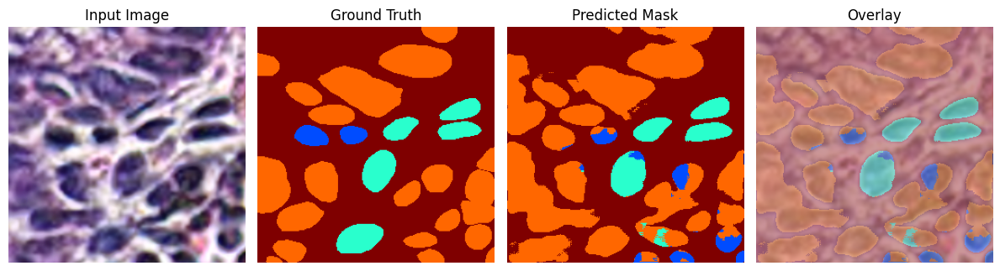

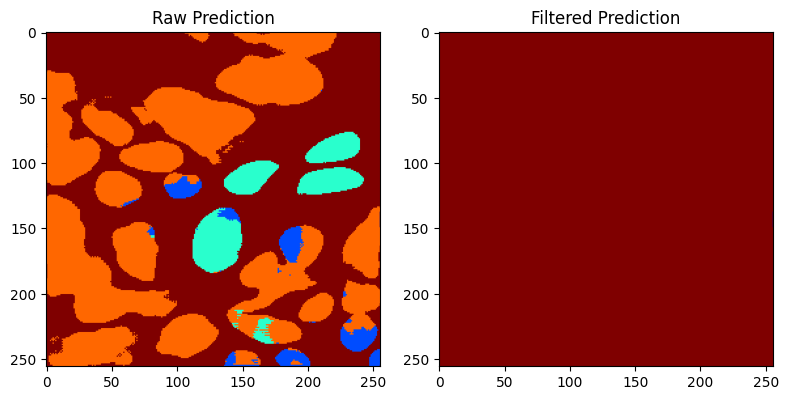

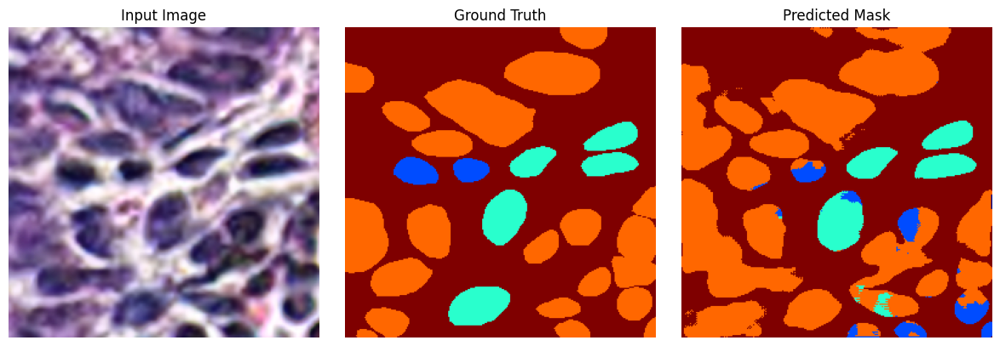


Sample 11
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


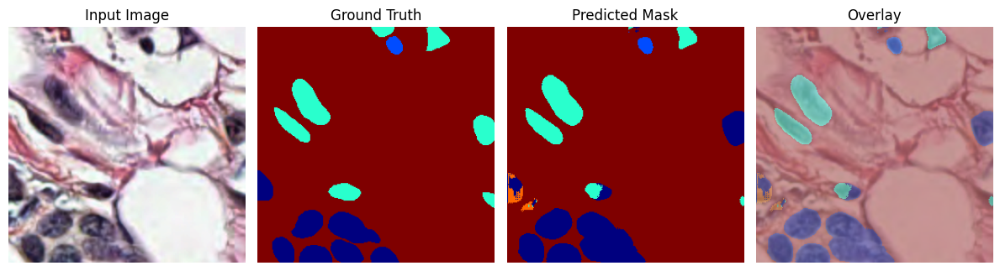

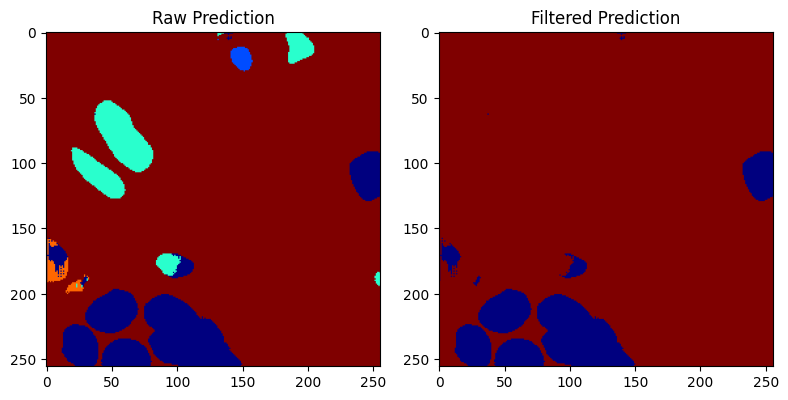

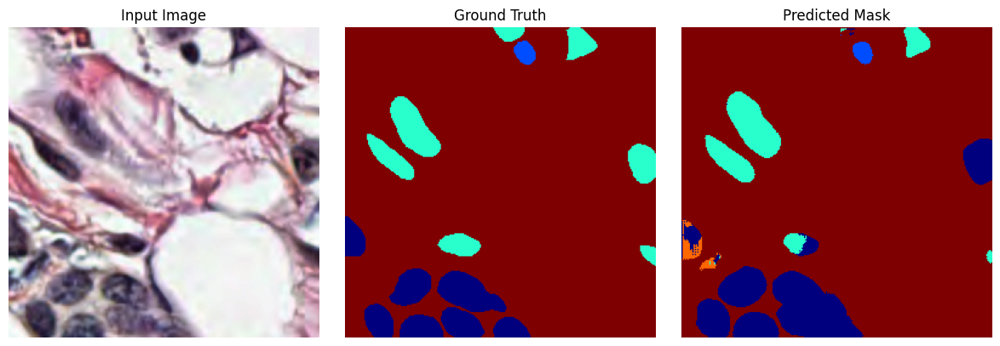


Sample 12
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


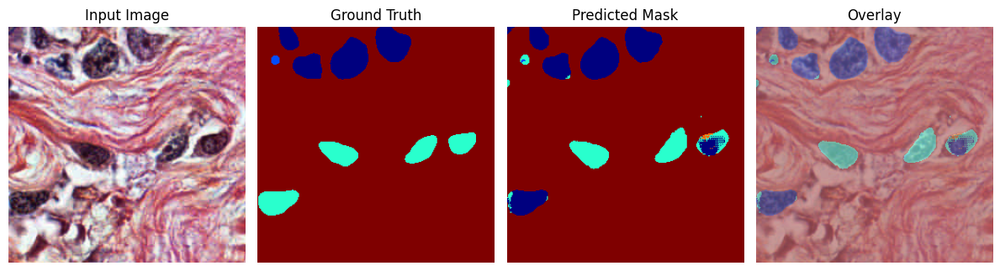

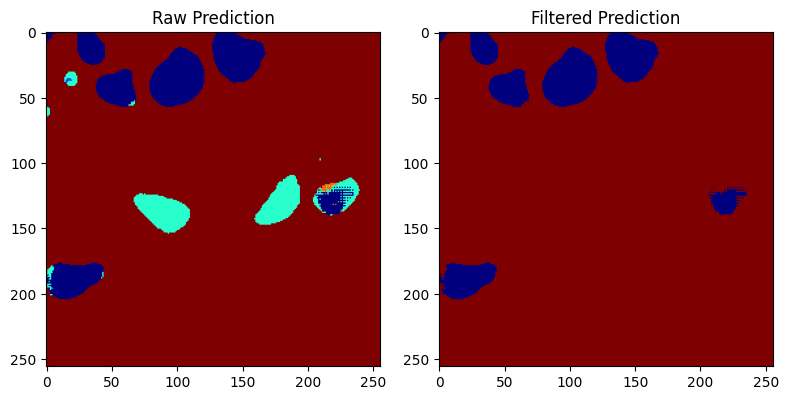

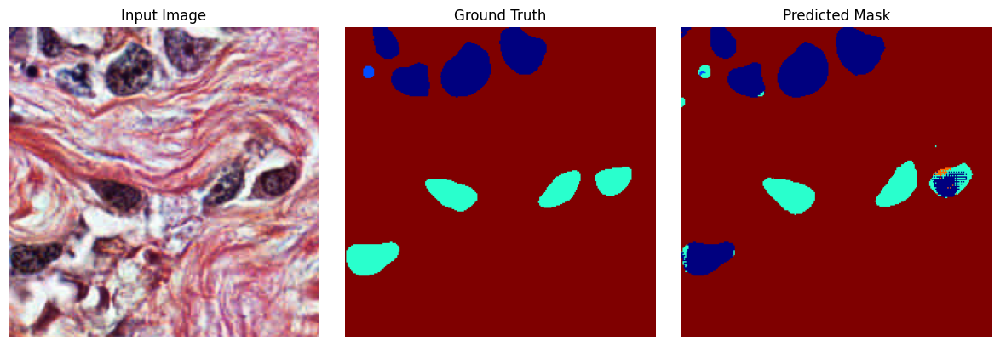


Sample 13
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


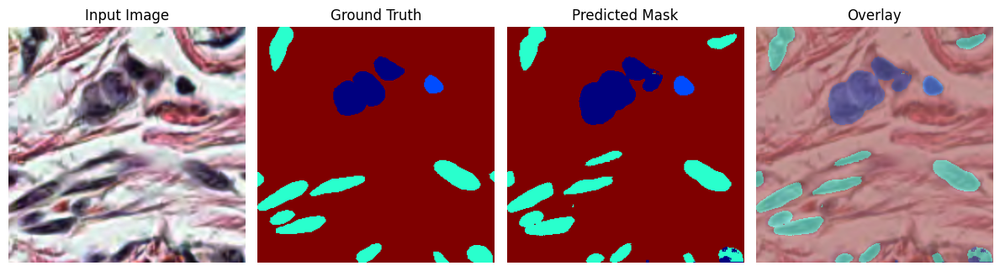

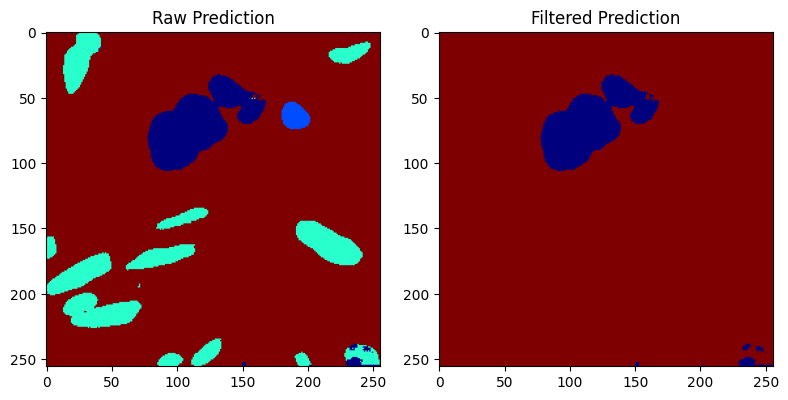

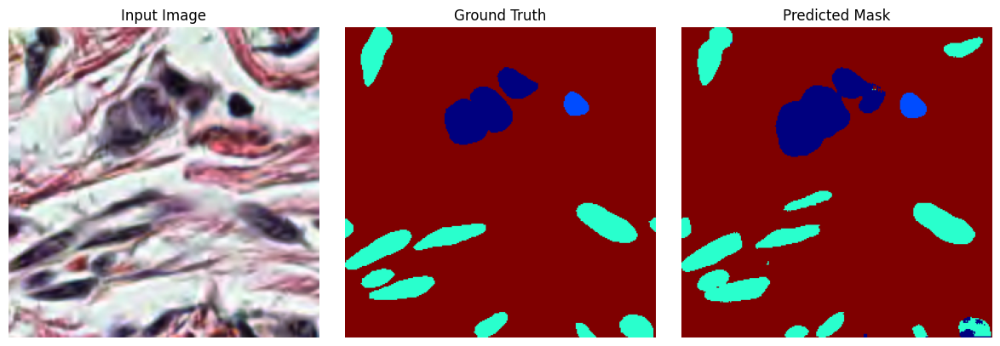


Sample 14
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


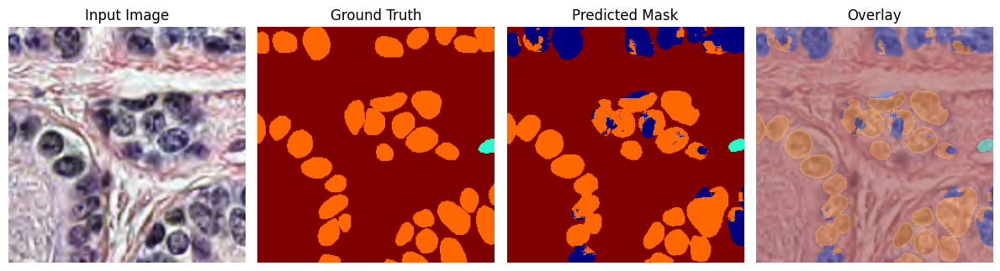

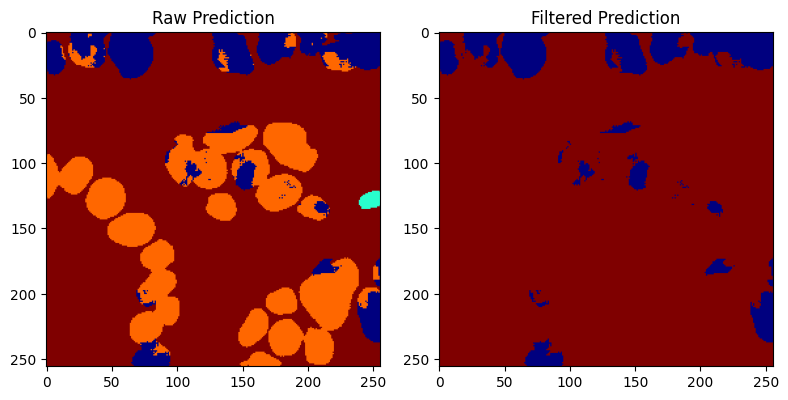

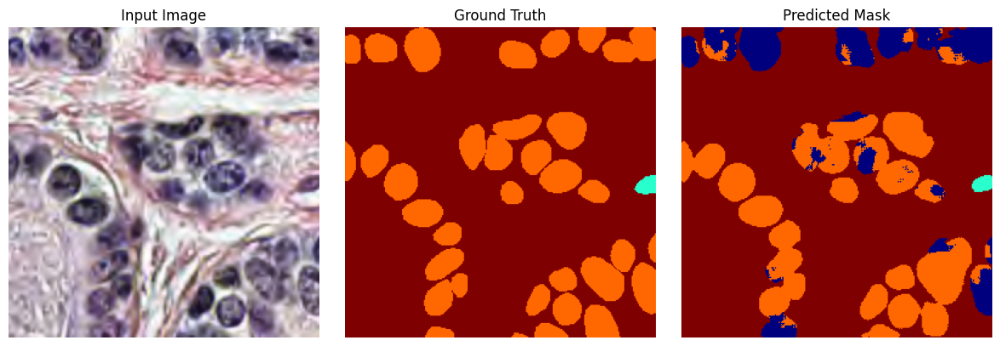


Sample 15
Image batch shape: (4, 256, 256, 3)
Mask batch shape: (4, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Prediction shape: (4, 256, 256, 6)
Image shape: (256, 256, 3)
True mask shape: (256, 256)
Pred mask shape: (256, 256)


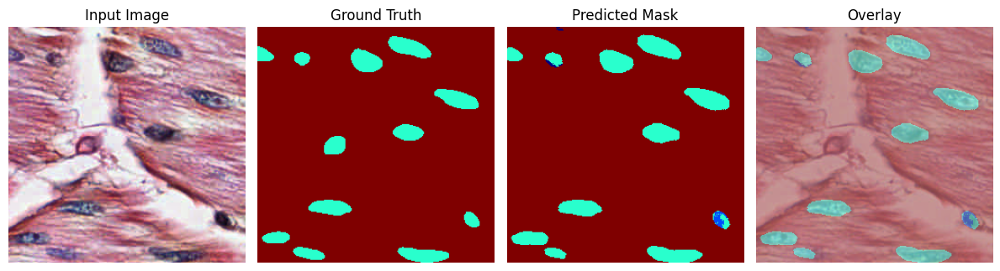

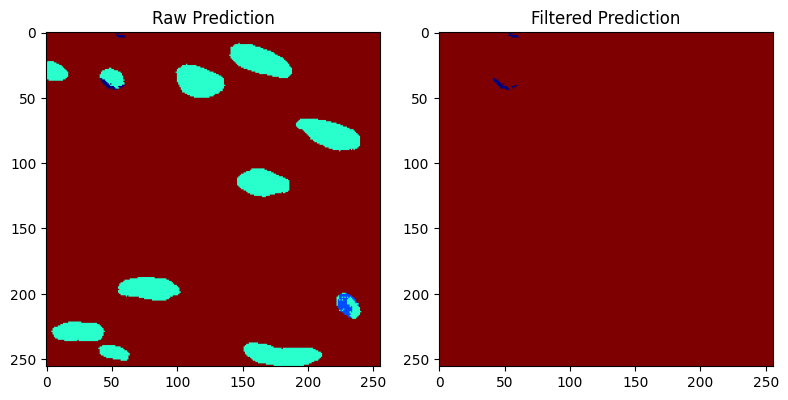

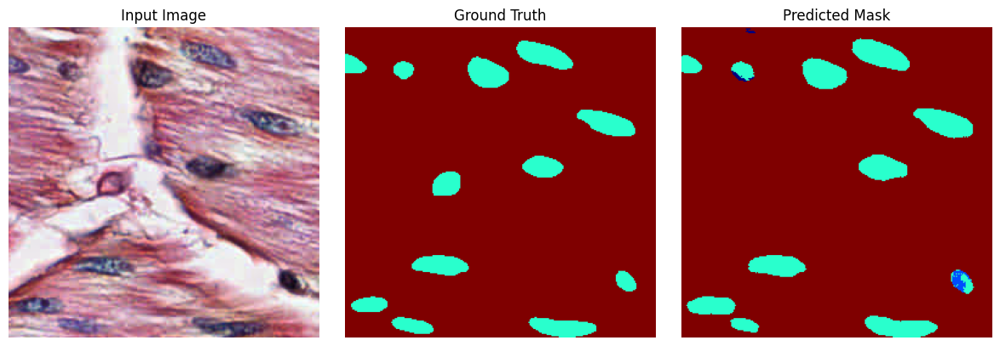

In [ ]:
def display_predictions(model, test_generator, num_samples=3):
    for i in range(num_samples):
        img_batch, mask_batch = test_generator[i]

        print(f"\nSample {i+1}")
        print("Image batch shape:", img_batch.shape)
        print("Mask batch shape:", mask_batch.shape)

        prediction = model.predict(img_batch)
        print("Prediction shape:", prediction.shape)

        img = img_batch[0]
        true_mask = mask_batch[0]
        pred_mask = prediction[0]

        if true_mask.ndim == 3:
            true_mask = np.argmax(true_mask, axis=-1)

        pred_mask = np.argmax(pred_mask, axis=-1)

        print("Image shape:", img.shape)
        print("True mask shape:", true_mask.shape)
        print("Pred mask shape:", pred_mask.shape)

        # Plotting overlay comparisons
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 4, 1)
        plt.imshow(img)
        plt.title("Input Image")
        plt.axis('off')
        plt.subplot(1, 4, 2)
        plt.imshow(true_mask, cmap='jet', vmin=0, vmax=5)
        plt.title("Ground Truth")
        plt.axis('off')
        plt.subplot(1, 4, 3)
        plt.imshow(pred_mask, cmap='jet', vmin=0, vmax=5)
        plt.title("Predicted Mask")
        plt.axis('off')
        plt.subplot(1, 4, 4)
        plt.imshow(img, alpha=0.6)
        plt.imshow(pred_mask, cmap='jet', alpha=0.4)
        plt.title("Overlay")
        plt.axis('off')
        plt.tight_layout()
        plt.show()

        filtered_pred_mask = morphology.remove_small_objects(pred_mask.astype(bool), min_size=100).astype(np.uint8)
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(pred_mask, cmap='jet')
        plt.title("Raw Prediction")
        plt.subplot(1, 2, 2)
        plt.imshow(filtered_pred_mask, cmap='jet')
        plt.title("Filtered Prediction")
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(12, 4))

        plt.subplot(1, 3, 1)
        plt.imshow(img)
        plt.title("Input Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(true_mask, cmap='jet', vmin=0, vmax=5)
        plt.title("Ground Truth")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(pred_mask, cmap='jet', vmin=0, vmax=5)
        plt.title("Predicted Mask")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

#  Visualizing prediction for `num_samples`
display_predictions(model, test_generator, num_samples=15)